In [1]:
!pip install opencv-python

In [2]:
import cv2 as cv
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

# Question 1 Transformations

### Question 1a

In [3]:
# calculate new shape for rotated image
def ICV_calc_shape(shape, angle):
    angle = angle % np.pi
    degree_90 = np.pi / 2
    angle2 = angle - degree_90 if angle > degree_90 else angle
    d = None
    if len(shape) == 3:
        row, col, d = shape
    else:
        row, col = shape
    if angle > degree_90:
        row, col = col, row
        
    M = np.array([
        [np.cos(angle2), np.sin(angle2)],
        [np.sin(angle2), np.cos(angle2)]
    ])
    new_row, new_col = np.dot(M, np.array([row, col]))
    new_shape = (round(new_row), round(new_col), d) if d else (round(new_row), round(new_col))
    return new_shape

def ICV_rotate(img, angle):
    # convert angle to radian
    angle = np.radians(angle)
    # define rotation matrix
    R = np.array([
        [np.cos(angle), np.sin(angle)],
        [-np.sin(angle), np.cos(angle)]
    ])
    # define inverse of rotation matrix
    RT = np.linalg.inv(R)
    
    # define empty array for storing new coordinates with rotation matrix
    ret_img_loc = np.zeros((img.shape[0], img.shape[1], 2), dtype=float)
    # calculate for new coordinates
    for i in range(len(img)):
        for j in range(len(img[i])):
            r, c = np.dot(R, np.array([i, j]))
            ret_img_loc[i][j] = [r, c]
            
    # get the rotated origin coordinate (0, 0)
    tmp = ret_img_loc.reshape(ret_img_loc.shape[0] * ret_img_loc.shape[1], ret_img_loc.shape[2])
    x, y = (tmp.min(0) * -1).round().astype(int)
            
    # define empty array for storing rotated image
    ret_img = np.zeros(ICV_calc_shape(img.shape, angle), dtype=img.dtype)
    # define empty array for storing new coordinates with inverse of rotation matrix
    ret_img_loc_T = np.zeros((ret_img.shape[0], ret_img.shape[1], 2), dtype=float)
    # for each coordinate in the rotated image, calculate for the corresponding coordinate of the original image
    for i in range(len(ret_img)):
        for j in range(len(ret_img[i])):
            r, c = np.dot(RT, np.array([i, j]))
            ret_img_loc_T[i][j] = [r, c]
    
    # shift the new coordinates based on the rotated origin coordinate (0, 0)
    ret_img_loc_T = ret_img_loc_T + ret_img_loc_T[x][y] * -1
    ret_img_loc_T = ret_img_loc_T.round().astype(int)
    # convert the image to rotated image
    x_max = img.shape[0]
    y_max = img.shape[1]
    for i in range(len(ret_img)):
        for j in range(len(ret_img[i])):
            x, y = ret_img_loc_T[i][j]
            ret_img[i][j] = img[x][y] if x >= 0 and abs(x) < x_max and y >= 0 and abs(y) < y_max else ret_img[i][j]
            
    return ret_img

def ICV_skew(img, angle):
    # convert angle to radian
    angle = np.radians(angle)
    # define rotation matrix
    R = np.array([
        [1, 0],
        [-np.tan(angle), 1]
    ])
    # define inverse of rotation matrix
    RT = np.linalg.inv(R)
    
    # define empty array for storing new coordinates with rotation matrix
    ret_img_loc = np.zeros((img.shape[0], img.shape[1], 2), dtype=float)
    # calculate for new coordinates
    for i in range(len(img)):
        for j in range(len(img[i])):
            r, c = np.dot(R, np.array([i, j]))
            ret_img_loc[i][j] = [r, c]
            
    # get the rotated origin coordinate (0, 0)
    tmp = ret_img_loc.reshape(ret_img_loc.shape[0] * ret_img_loc.shape[1], ret_img_loc.shape[2])
    x, y = (tmp.min(0) * -1).round().astype(int)
            
    # define empty array for storing rotated image
    ret_img = np.zeros((img.shape[0], tmp.max(0).round().astype(int)[1] - tmp.min(0).round().astype(int)[1], img.shape[2]), dtype=img.dtype)
    # define empty array for storing new coordinates with inverse of rotation matrix
    ret_img_loc_T = np.zeros((ret_img.shape[0], ret_img.shape[1], 2), dtype=float)
    # for each coordinate in the rotated image, calculate for the corresponding coordinate of the original image
    for i in range(len(ret_img)):
        for j in range(len(ret_img[i])):
            r, c = np.dot(RT, np.array([i, j]))
            ret_img_loc_T[i][j] = [r, c]
    
    # shift the new coordinates based on the rotated origin coordinate (0, 0)
    ret_img_loc_T = ret_img_loc_T + ret_img_loc_T[x][y] * -1
    ret_img_loc_T = ret_img_loc_T.round().astype(int)
    # convert the image to rotated image
    x_max = img.shape[0]
    y_max = img.shape[1]
    for i in range(len(ret_img)):
        for j in range(len(ret_img[i])):
            x, y = ret_img_loc_T[i][j]
            ret_img[i][j] = img[x][y] if x >= 0 and abs(x) < x_max and y >= 0 and abs(y) < y_max else ret_img[i][j]
            
    return ret_img

### Question 1b

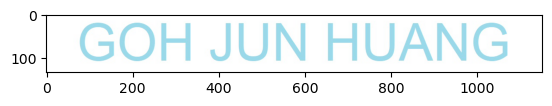

In [4]:
img = plt.imread('name.jpg')
plt.imshow(img)

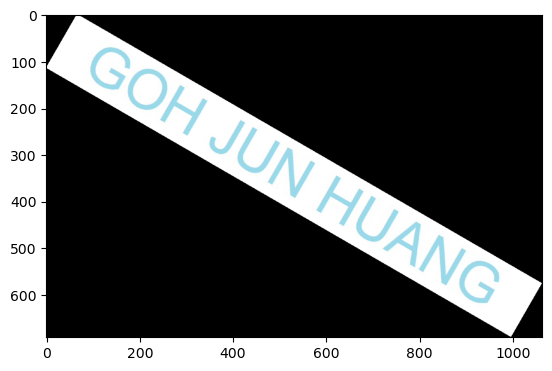

In [5]:
img_R = ICV_rotate(img, 30)
plt.imsave('name_R_30.jpg', img_R)
plt.imshow(img_R)

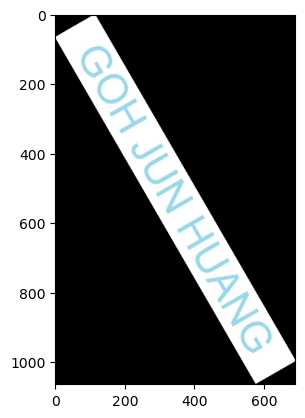

In [6]:
img_R = ICV_rotate(img, 60)
plt.imsave('name_R_60.jpg', img_R)
plt.imshow(img_R)

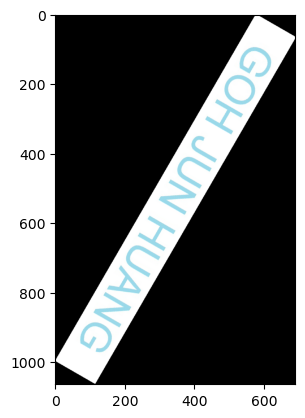

In [7]:
img_R = ICV_rotate(img, 120)
plt.imsave('name_R_120.jpg', img_R)
plt.imshow(img_R)

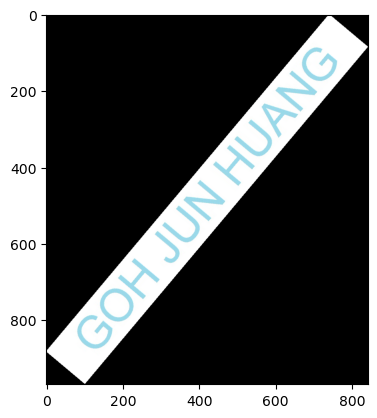

In [8]:
img_R = ICV_rotate(img, -50)
plt.imsave('name_R_n50.jpg', img_R)
plt.imshow(img_R)

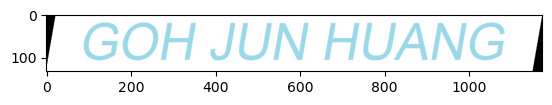

In [9]:
img_S = ICV_skew(img, 10)
plt.imsave('name_S_10.jpg', img_S)
plt.imshow(img_S)

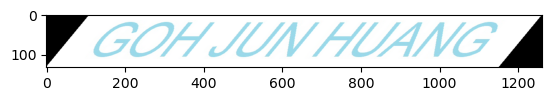

In [10]:
img_S = ICV_skew(img, 40)
plt.imsave('name_S_40.jpg', img_S)
plt.imshow(img_S)

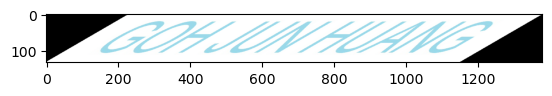

In [11]:
img_S = ICV_skew(img, 60)
plt.imsave('name_S_60.jpg', img_S)
plt.imshow(img_S)

### Question 1c

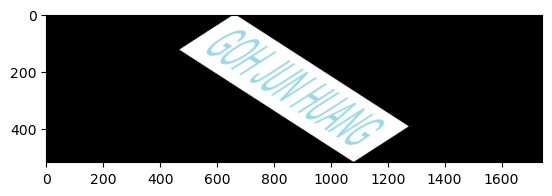

In [12]:
img_R = ICV_rotate(img, 20)
img_S = ICV_skew(img_R, 50)
plt.imsave('name_R20_S50.jpg', img_S)
plt.imshow(img_S)

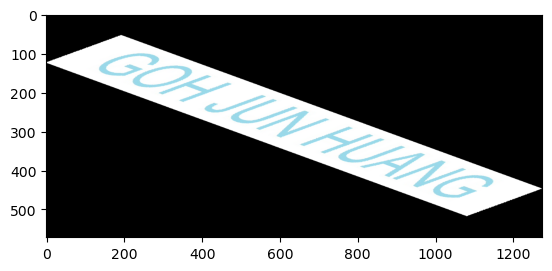

In [13]:
img_S = ICV_skew(img, 50)
img_R = ICV_rotate(img_S, 20)
plt.imsave('name_S50_R20.jpg', img_R)
plt.imshow(img_R)

# Question 2 Convolution

### Question 2a

In [14]:
# convert RGB image to grayscale image
def ICV_RGB2GRAY(img):
    M = [[1/3], [1/3], [1/3]]
    ret_img = np.zeros((img.shape[0], img.shape[1]), dtype=float)
    for i in range(img.shape[0]):
        ret_img[i] = np.dot(img[i], M).reshape(img.shape[1])
    return ret_img

def ICV_conv(img, kernel):
    r_count, c_count = kernel.shape
    r_count = int(r_count / 2)
    c_count = int(c_count / 2)
    
    # padding
    padded_img = np.concatenate((img[0:r_count], img, img[-r_count:]))
    padded_img_T = padded_img.transpose()
    padded_img = np.concatenate((padded_img_T[0:c_count].transpose(), padded_img, padded_img_T[-c_count:].transpose()),axis=1)
    
    padded_img_shape = padded_img.shape
    ret_img = np.zeros((img.shape[0], img.shape[1]), dtype=float)
    for r in range(r_count, padded_img_shape[0] - r_count):
        for c in range(c_count, padded_img_shape[1] - c_count):
            ret_img[r - r_count][c - c_count] = round((padded_img[r - r_count:r + r_count + 1, c - c_count:c + c_count + 1] * kernel).sum())
            
    return ret_img

### Question 2b

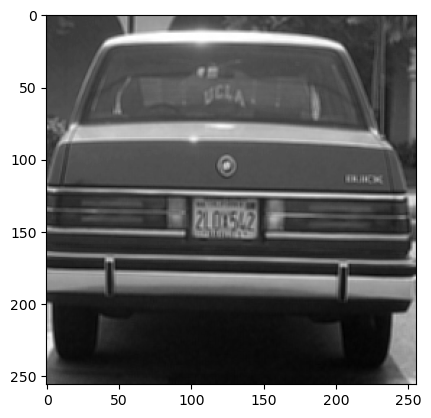

In [15]:
kernel = np.zeros((3, 3), dtype=float)
kernel += (1 / (kernel.shape[0] * kernel.shape[1]))

img = plt.imread('Dataset/DatasetA/car-1.jpg')
img_conv = ICV_conv(ICV_RGB2GRAY(img), kernel)
plt.imsave('2b.jpg', img_conv, cmap='gray')
plt.imshow(img_conv, cmap='gray')

### Question 2c

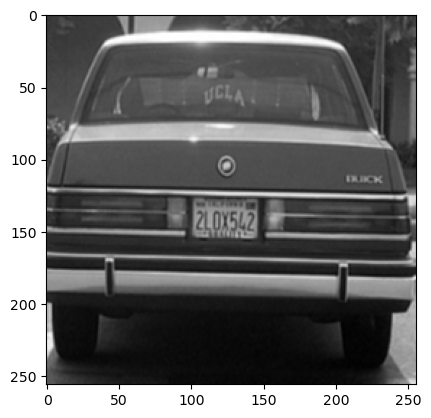

In [16]:
kernelA = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1],
])
img_conv = ICV_conv(ICV_RGB2GRAY(img), kernelA)
plt.imsave('2cA.jpg', img_conv, cmap='gray')
plt.imshow(img_conv, cmap='gray')

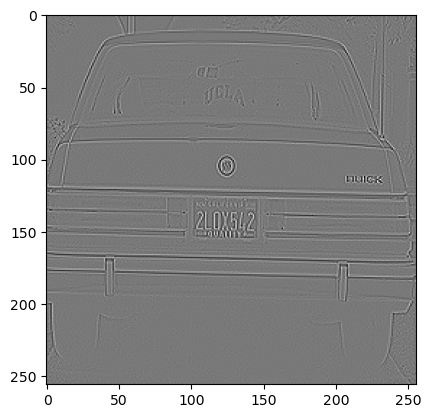

In [17]:
kernelB = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0],
])
img_conv = ICV_conv(ICV_RGB2GRAY(img), kernelB)
plt.imsave('2cB.jpg', img_conv, cmap='gray')
plt.imshow(img_conv, cmap='gray')

### Question 2d

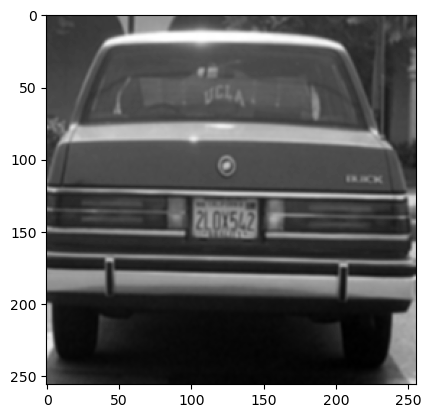

In [18]:
img_conv = ICV_conv(ICV_RGB2GRAY(img), kernelA)
img_conv = ICV_conv(img_conv, kernelA)
plt.imsave('2cAA.jpg', img_conv, cmap='gray')
plt.imshow(img_conv, cmap='gray')

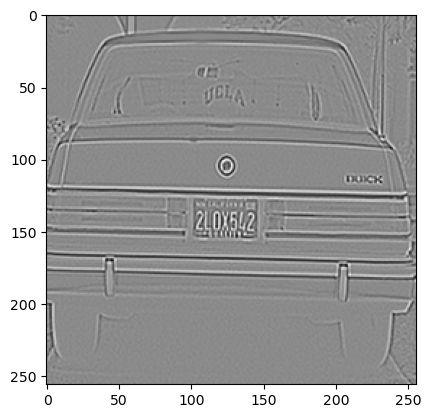

In [19]:
img_conv = ICV_conv(ICV_RGB2GRAY(img), kernelA)
img_conv = ICV_conv(img_conv, kernelB)
plt.imsave('2cAB.jpg', img_conv, cmap='gray')
plt.imshow(img_conv, cmap='gray')

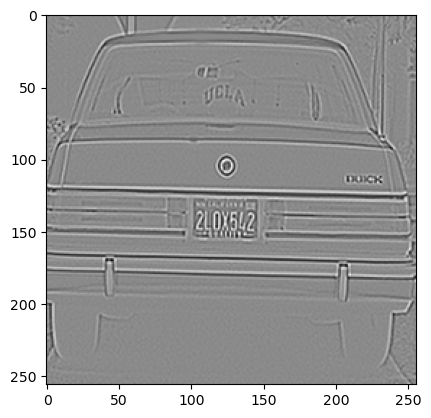

In [20]:
img_conv = ICV_conv(ICV_RGB2GRAY(img), kernelB)
img_conv = ICV_conv(img_conv, kernelA)
plt.imsave('2cBA.jpg', img_conv, cmap='gray')
plt.imshow(img_conv, cmap='gray')

# Question 3

### Question 3a

In [21]:
def ICV_hist(img):
    x = [i for i in range(256)]
    img_BGR = img.reshape(img.shape[0] * img.shape[1], 3).transpose()
    count_BGR = []
    for i in range(len(img_BGR)):
        count_BGR.append([np.count_nonzero(img_BGR[i] == val) for val in x])
    return np.array(x), np.array(count_BGR)

In [22]:
vid = cv.VideoCapture('Dataset/DatasetB.avi')
frames = []
while vid.isOpened():
    ret, frame = vid.read()
    if not ret:
        break
    frames.append(frame)
vid.release()

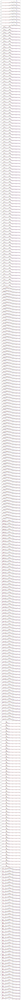

In [23]:
fig, axs = plt.subplots(len(frames), figsize=(10,500))
for i in range(len(frames)):
    x, ys = ICV_hist(frames[i])
    axs[i].plot(x, ys[0], color='b')
    axs[i].plot(x, ys[1], color='g')    
    axs[i].plot(x, ys[2], color='r')
plt.show()

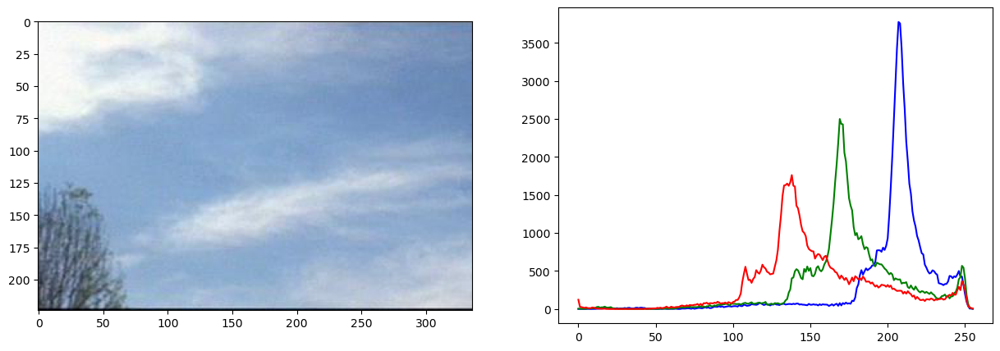

In [24]:
fig, axs = plt.subplots(1,2, figsize=(15, 5))
frame_RGB = np.array([np.array([np.flip(x) for x in y]) for y in frames[0]])
axs[0].imshow(frame_RGB)
x, ys = ICV_hist(frames[0])
axs[1].plot(x, ys[0], color='b')
axs[1].plot(x, ys[1], color='g')    
axs[1].plot(x, ys[2], color='r')

plt.imsave('3a_img1.jpg', frame_RGB)
extent = axs[1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('3a_hist1.jpg', bbox_inches=extent.expanded(1.2, 1.2))
plt.show()

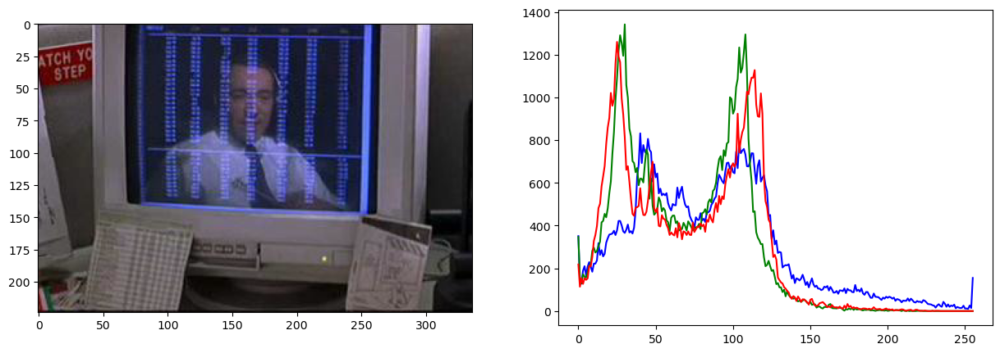

In [25]:
fig, axs = plt.subplots(1,2, figsize=(15, 5))
frame_RGB = np.array([np.array([np.flip(x) for x in y]) for y in frames[10]])
axs[0].imshow(frame_RGB)
x, ys = ICV_hist(frames[10])
axs[1].plot(x, ys[0], color='b')
axs[1].plot(x, ys[1], color='g')    
axs[1].plot(x, ys[2], color='r')

plt.imsave('3a_img2.jpg', frame_RGB)
extent = axs[1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('3a_hist2.jpg', bbox_inches=extent.expanded(1.2, 1.2))
plt.show()

### Question 3b

In [26]:
def ICV_hist_intersection(h1, h2):
    return np.minimum(h1, h2).sum(axis=1)

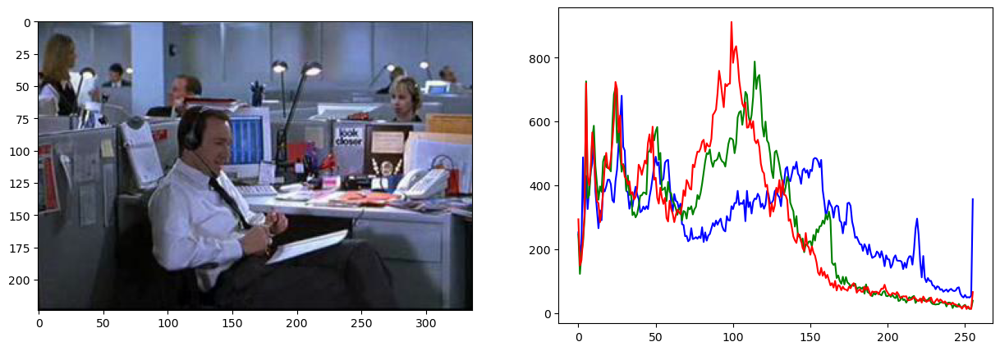

In [27]:
fig, axs = plt.subplots(1,2, figsize=(15, 5))
frame_RGB = np.array([np.array([np.flip(x) for x in y]) for y in frames[200]])
axs[0].imshow(frame_RGB)
x, ys1 = ICV_hist(frames[200])
axs[1].plot(x, ys1[0], color='b')
axs[1].plot(x, ys1[1], color='g')    
axs[1].plot(x, ys1[2], color='r')

plt.imsave('3b_img1.jpg', frame_RGB)
extent = axs[1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('3b_hist1.jpg', bbox_inches=extent.expanded(1.2, 1.2))
plt.show()

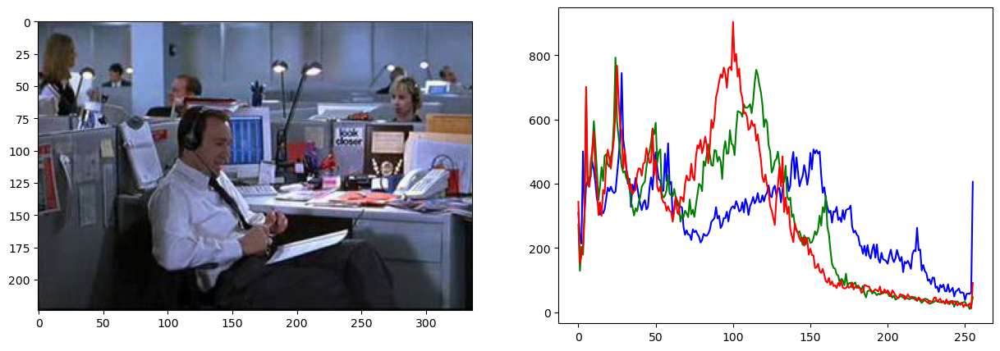

In [28]:
fig, axs = plt.subplots(1,2, figsize=(15, 5))
frame_RGB = np.array([np.array([np.flip(x) for x in y]) for y in frames[201]])
axs[0].imshow(frame_RGB)
x, ys2 = ICV_hist(frames[201])
axs[1].plot(x, ys2[0], color='b')
axs[1].plot(x, ys2[1], color='g')    
axs[1].plot(x, ys2[2], color='r')

plt.imsave('3b_img2.jpg', frame_RGB)
extent = axs[1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('3b_hist2.jpg', bbox_inches=extent.expanded(1.2, 1.2))
plt.show()

In [29]:
print('Intersection value of BGR for frame 200 and 201 is ', ICV_hist_intersection(ys1, ys2))

Intersection value of BGR for frame 200 and 201 is  [72360 72738 72374]


In [30]:
def ICV_hist_intersection_norm(h1, h2):
    intersection = ICV_hist_intersection(h1, h2)
    return intersection / h2.sum(axis=1)

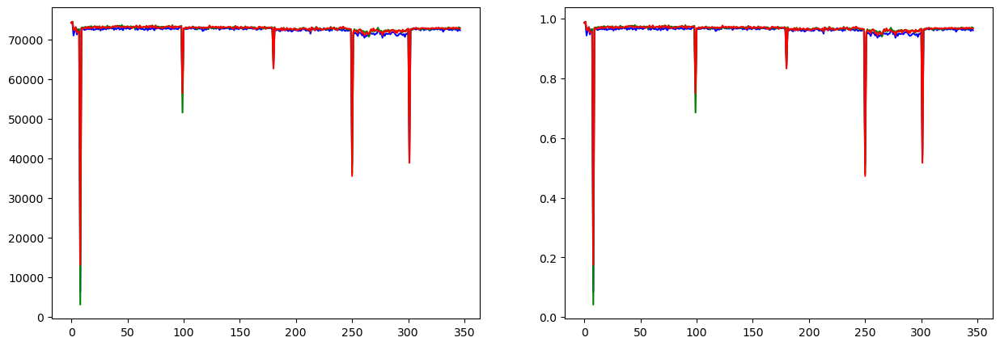

In [31]:
x = [i for i in range(len(frames) - 1)]
intersection = np.zeros((len(frames) - 1, 3))
intersection_norm = np.zeros((len(frames) - 1, 3))
for i in range(len(frames) - 1):
    tmp, ys1 = ICV_hist(frames[i])
    tmp, ys2 = ICV_hist(frames[i + 1])
    intersection[i] = ICV_hist_intersection(ys1, ys2)
    intersection_norm[i] = ICV_hist_intersection_norm(ys1, ys2)

intersection_BGR = intersection.transpose()
intersection_norm_BGR = intersection_norm.transpose()
fig, axs = plt.subplots(1,2, figsize=(15, 5))
axs[0].plot(x, intersection_BGR[0], color='b')
axs[0].plot(x, intersection_BGR[1], color='g')    
axs[0].plot(x, intersection_BGR[2], color='r')
axs[1].plot(x, intersection_norm_BGR[0], color='b')
axs[1].plot(x, intersection_norm_BGR[1], color='g')    
axs[1].plot(x, intersection_norm_BGR[2], color='r')

extent = axs[0].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('3b_img_intersection.jpg', bbox_inches=extent.expanded(1.2, 1.2))
extent = axs[1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('3b_img_intersection_norm.jpg', bbox_inches=extent.expanded(1.2, 1.2))
plt.show()

# Question 4

### Question 4a

In [32]:
def ICV_hist_gray(img, norm=True):
    x = [i for i in range(256)]
    count = [np.count_nonzero(img == val) for val in x]
    
    div = 1
    if norm:
        div = img.shape[0] * img.shape[1]
    return np.array(x), np.array(count) / div

def ICV_LBP(img):
    # padding
    padded_img = np.concatenate((np.zeros((1, img.shape[1])), img, np.zeros((1, img.shape[1]))))
    padded_img_T = padded_img.transpose()
    padded_img = np.concatenate((np.zeros((padded_img_T.shape[1], 1)), padded_img, np.zeros((padded_img_T.shape[1], 1))),axis=1)
    
    # calculate bit-codes
    padded_img_shape = padded_img.shape
    ret_img = np.zeros((img.shape[0], img.shape[1]), dtype=int)
    for r in range(1, padded_img_shape[0] - 1):
        for c in range(1, padded_img_shape[1] - 1):
            tmp = padded_img[r - 1:r + 1 + 1, c - 1:c + 1 + 1].copy()
            ctr = padded_img[r][c]
            tmp[tmp < ctr] = 0
            tmp[tmp >= ctr] = 1
            bit_codes = np.concatenate((tmp[0], [tmp[1][2]], np.flip(tmp[2]), [tmp[1][0]])).astype(int)
            ret_img[r - 1][c - 1] = int(''.join(bit_codes.astype(str)), 2)
    return ret_img

def ICV_div_window_LBP(img, win_size):
    wins = []
    LBPs = []
    hs = []
    for i in range(0, img.shape[0], win_size[0]):
        for j in range(0, img.shape[1], win_size[1]):
            wins.append(img[i:i + win_size[0], j:j + win_size[1]].copy())
            LBPs.append(ICV_LBP(wins[-1]))
            hs.append(ICV_hist_gray(wins[-1]))
    return np.array(wins), np.array(LBPs), np.array(hs)

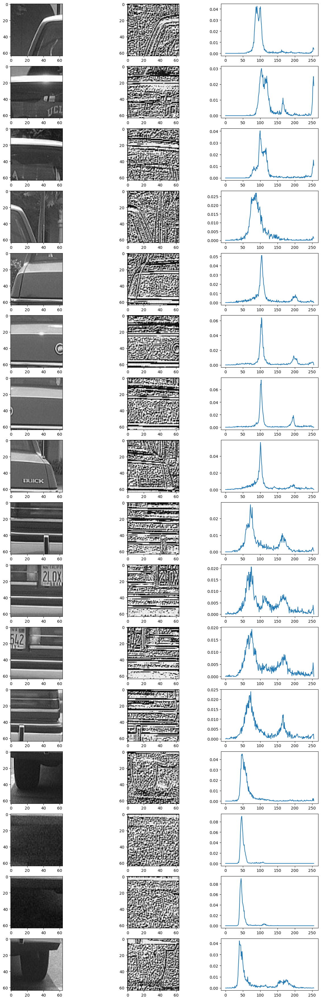

In [33]:
img = plt.imread('Dataset/DatasetA/car-1.jpg')
img = ICV_RGB2GRAY(img).round().astype(int)
wins, LBPs, hs = ICV_div_window_LBP(img, (64, 64))
fig, axs = plt.subplots(16, 3, figsize=(15, 45))
for i in range(len(wins)):
    axs[i][0].imshow(wins[i], cmap='gray')
    axs[i][1].imshow(LBPs[i], cmap='gray')
    axs[i][2].plot(hs[i][0], hs[i][1])
plt.show()

In [34]:
plt.imsave('4a_img1.jpg', wins[0], cmap='gray')
plt.imsave('4a_LBP1.jpg', LBPs[0], cmap='gray')
extent = axs[0][2].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('4a_h1.jpg', bbox_inches=extent.expanded(1.3, 1.35))

plt.imsave('4a_img2.jpg', wins[2], cmap='gray')
plt.imsave('4a_LBP2.jpg', LBPs[2], cmap='gray')
extent = axs[2][2].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('4a_h2.jpg', bbox_inches=extent.expanded(1.3, 1.35))

plt.imsave('4a_img3.jpg', wins[10], cmap='gray')
plt.imsave('4a_LBP3.jpg', LBPs[10], cmap='gray')
extent = axs[10][2].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('4a_h3.jpg', bbox_inches=extent.expanded(1.3, 1.35))

### Question 4b

In [35]:
def ICV_global_desc(hs):
    new_h = []
    count = 0
    for h in hs:
        new_h.append([h[0] + count, h[1]])
        count += 256
    new_h = list(zip(*new_h))
    new_h1 = np.concatenate(new_h[1])
    return np.concatenate(new_h[0]).astype(int), new_h1 / new_h1.sum()

def ICV_hist_intersection_gray(h1, h2):
    return np.minimum(h1, h2).sum()

In [36]:
imgs = {
    'car-1': ICV_RGB2GRAY(plt.imread('Dataset/DatasetA/car-1.jpg')).round().astype(int),
    'car-2': ICV_RGB2GRAY(plt.imread('Dataset/DatasetA/car-2.jpg')).round().astype(int),
    'car-3': ICV_RGB2GRAY(plt.imread('Dataset/DatasetA/car-3.jpg')).round().astype(int),
    'face-1': ICV_RGB2GRAY(plt.imread('Dataset/DatasetA/face-1.jpg')).round().astype(int),
    'face-2': ICV_RGB2GRAY(plt.imread('Dataset/DatasetA/face-2.jpg')).round().astype(int),
    'face-3': ICV_RGB2GRAY(plt.imread('Dataset/DatasetA/face-3.jpg')).round().astype(int),
}
img_face = imgs['face-1']
img_car = imgs['car-1']

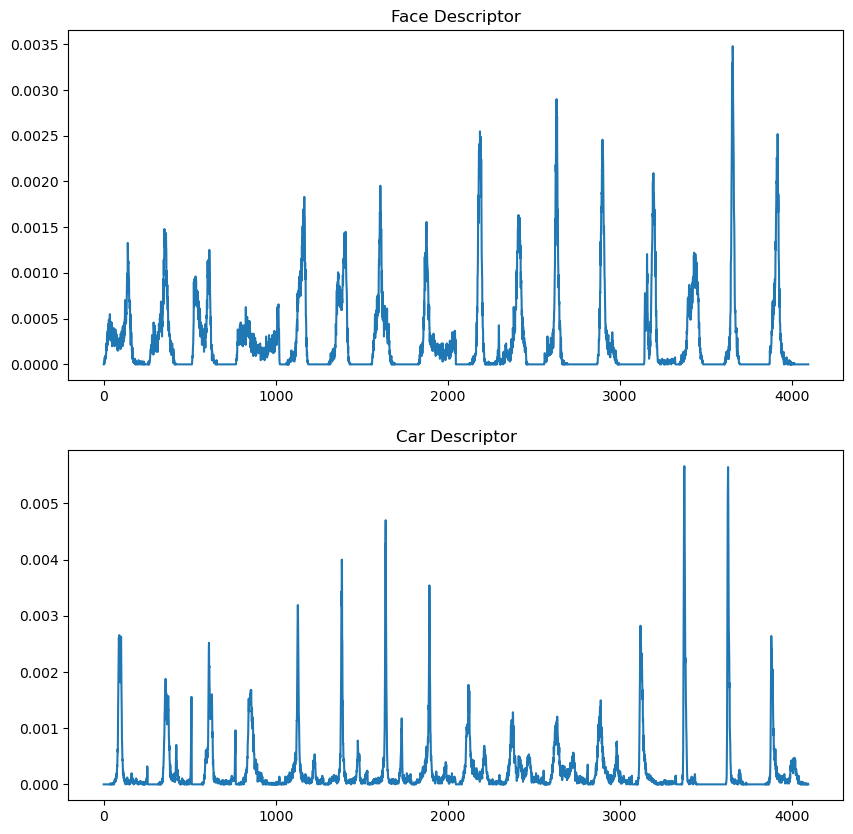

Intersection value for face-1 and car-1 is 0.3450775146484375
Intersection value for car-1 and car-1 is 1.0
Hence, car-1 is identified as car

Intersection value for face-1 and car-2 is 0.3726959228515625
Intersection value for car-1 and car-2 is 0.29656982421875
Hence, car-2 is identified as face

Intersection value for face-1 and car-3 is 0.322235107421875
Intersection value for car-1 and car-3 is 0.3609466552734375
Hence, car-3 is identified as car

Intersection value for face-1 and face-1 is 1.0
Intersection value for car-1 and face-1 is 0.3450775146484375
Hence, face-1 is identified as face

Intersection value for face-1 and face-2 is 0.2958984375
Intersection value for car-1 and face-2 is 0.2538604736328125
Hence, face-2 is identified as face

Intersection value for face-1 and face-3 is 0.3830413818359375
Intersection value for car-1 and face-3 is 0.2753143310546875
Hence, face-3 is identified as face



In [37]:
win_size = (64, 64)
wins, LBPs, hs = ICV_div_window_LBP(img_face, win_size)
global_h_face = ICV_global_desc(hs)
wins, LBPs, hs = ICV_div_window_LBP(img_car, win_size)
global_h_car = ICV_global_desc(hs)

fig, axs = plt.subplots(2, figsize=(10, 10))
axs[0].plot(global_h_face[0], global_h_face[1])
axs[0].set_title('Face Descriptor')
axs[1].plot(global_h_car[0], global_h_car[1])
axs[1].set_title('Car Descriptor')

plt.imsave('4b_face.jpg', img_face, cmap='gray')
plt.imsave('4b_car.jpg', img_car, cmap='gray')
extent = axs[0].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('4b_face_h.jpg', bbox_inches=extent.expanded(1.3, 1.2))
extent = axs[1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('4b_car_h.jpg', bbox_inches=extent.expanded(1.3, 1.2))
plt.show()

for name, img in imgs.items():
    wins, LBPs, hs = ICV_div_window_LBP(img, win_size)
    global_h = ICV_global_desc(hs)
    face_intersection = ICV_hist_intersection_gray(global_h[1], global_h_face[1])
    car_intersection = ICV_hist_intersection_gray(global_h[1], global_h_car[1])
    print('Intersection value for face-1 and {} is {}'.format(name, face_intersection))
    print('Intersection value for car-1 and {} is {}'.format(name, car_intersection))                                        
    print('Hence, {} is identified as {}\n'.format(name, 'face' if face_intersection > car_intersection else 'car'))

### Question 4c

In [38]:
win_size = (16, 16)
wins, LBPs, hs = ICV_div_window_LBP(img_face, win_size)
global_h_face = ICV_global_desc(hs)
wins, LBPs, hs = ICV_div_window_LBP(img_car, win_size)
global_h_car = ICV_global_desc(hs)

for name, img in imgs.items():
    wins, LBPs, hs = ICV_div_window_LBP(img, win_size)
    global_h = ICV_global_desc(hs)
    face_intersection = ICV_hist_intersection_gray(global_h[1], global_h_face[1])
    car_intersection = ICV_hist_intersection_gray(global_h[1], global_h_car[1])
    print('Intersection value for face-1 and {} is {}'.format(name, face_intersection))
    print('Intersection value for car-1 and {} is {}'.format(name, car_intersection))                                        
    print('Hence, {} is identified as {}\n'.format(name, 'face' if face_intersection > car_intersection else 'car'))

Intersection value for face-1 and car-1 is 0.1878662109375
Intersection value for car-1 and car-1 is 1.0
Hence, car-1 is identified as car

Intersection value for face-1 and car-2 is 0.1586151123046875
Intersection value for car-1 and car-2 is 0.1405029296875
Hence, car-2 is identified as face

Intersection value for face-1 and car-3 is 0.1410369873046875
Intersection value for car-1 and car-3 is 0.19342041015625
Hence, car-3 is identified as car

Intersection value for face-1 and face-1 is 1.0
Intersection value for car-1 and face-1 is 0.1878662109375
Hence, face-1 is identified as face

Intersection value for face-1 and face-2 is 0.1280059814453125
Intersection value for car-1 and face-2 is 0.10791015625
Hence, face-2 is identified as face

Intersection value for face-1 and face-3 is 0.1912384033203125
Intersection value for car-1 and face-3 is 0.1386566162109375
Hence, face-3 is identified as face



### Question 4d

In [39]:
win_size = (128, 128)
wins, LBPs, hs = ICV_div_window_LBP(img_face, win_size)
global_h_face = ICV_global_desc(hs)
wins, LBPs, hs = ICV_div_window_LBP(img_car, win_size)
global_h_car = ICV_global_desc(hs)

for name, img in imgs.items():
    wins, LBPs, hs = ICV_div_window_LBP(img, win_size)
    global_h = ICV_global_desc(hs)
    face_intersection = ICV_hist_intersection_gray(global_h[1], global_h_face[1])
    car_intersection = ICV_hist_intersection_gray(global_h[1], global_h_car[1])
    print('Intersection value for face-1 and {} is {}'.format(name, face_intersection))
    print('Intersection value for car-1 and {} is {}'.format(name, car_intersection))                                        
    print('Hence, {} is identified as {}\n'.format(name, 'face' if face_intersection > car_intersection else 'car'))

Intersection value for face-1 and car-1 is 0.4693603515625
Intersection value for car-1 and car-1 is 1.0
Hence, car-1 is identified as car

Intersection value for face-1 and car-2 is 0.5307464599609375
Intersection value for car-1 and car-2 is 0.38946533203125
Hence, car-2 is identified as face

Intersection value for face-1 and car-3 is 0.403076171875
Intersection value for car-1 and car-3 is 0.4887542724609375
Hence, car-3 is identified as car

Intersection value for face-1 and face-1 is 1.0
Intersection value for car-1 and face-1 is 0.4693603515625
Hence, face-1 is identified as face

Intersection value for face-1 and face-2 is 0.3777923583984375
Intersection value for car-1 and face-2 is 0.34783935546875
Hence, face-2 is identified as face

Intersection value for face-1 and face-3 is 0.5372772216796875
Intersection value for car-1 and face-3 is 0.3554840087890625
Hence, face-3 is identified as face



### Question 4e

In [40]:
win_size = (56, 84)
wins, LBPs, hs = ICV_div_window_LBP(ICV_RGB2GRAY(frames[200]).round().astype(int), win_size)
global_h_frame200 = ICV_global_desc(hs)


f = [201, 0]
for i in f:
    wins, LBPs, hs = ICV_div_window_LBP(ICV_RGB2GRAY(frames[i]).round().astype(int), win_size)
    global_h = ICV_global_desc(hs)
    intersection = ICV_hist_intersection_gray(global_h[1], global_h_frame200[1])
    print('Intersection value for frame 200 and frame {} is {}'.format(str(i), intersection))

Intersection value for frame 200 and frame 201 is 0.8890306122448979
Intersection value for frame 200 and frame 0 is 0.10027370323129252


# Question 5

### Question 5a

In [41]:
vid = cv.VideoCapture('Dataset/DatasetC.avi')
frames = []
while vid.isOpened():
    ret, frame = vid.read()
    if not ret:
        break
    frames.append(frame)
vid.release()

In [42]:
def ICV_frame_diff(img1, img2):
    img1_gray = ICV_RGB2GRAY(img1).round().astype(int)
    img2_gray = ICV_RGB2GRAY(img2).round().astype(int)
    img_diff = np.absolute((img1_gray - img2_gray))
    return img_diff

def ICV_classification(img, threshold=10):
    classified_img = img.copy()
    classified_img[classified_img <= threshold] = 0
    classified_img[classified_img > threshold] = 1
    return classified_img

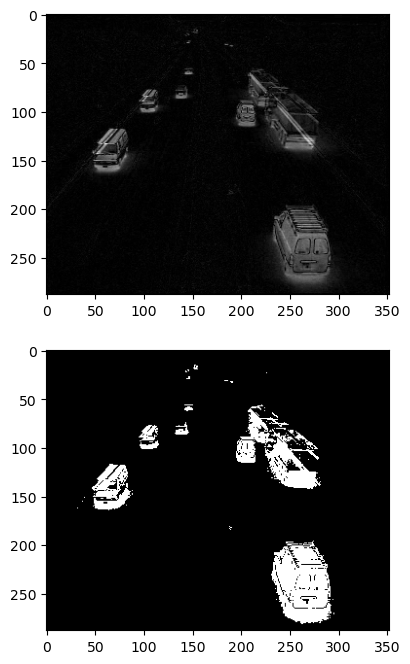

In [43]:
img_diff = ICV_frame_diff(frames[0], frames[20])
classified_img = ICV_classification(img_diff, threshold=30)
fig, axs = plt.subplots(2, figsize=(10, 8))
axs[0].imshow(img_diff, cmap='gray')
axs[1].imshow(classified_img, cmap='gray')

cv.imwrite('5a_ref.jpg', frames[0])
cv.imwrite('5a_frame1.jpg', frames[20])
plt.imsave('5a_diff1.jpg', img_diff, cmap='gray')
plt.imsave('5a_threshold1.jpg', classified_img, cmap='gray')
plt.imshow(classified_img, cmap='gray')
img_diff_h = ICV_hist_gray(img_diff)

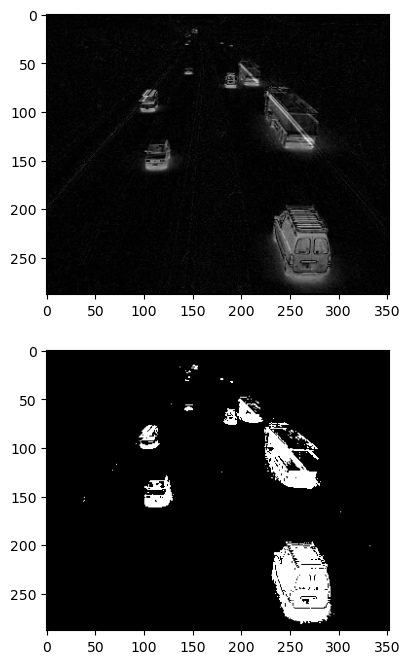

In [44]:
img_diff = ICV_frame_diff(frames[0], frames[40])
classified_img = ICV_classification(img_diff, threshold=30)
fig, axs = plt.subplots(2, figsize=(10, 8))
axs[0].imshow(img_diff, cmap='gray')
axs[1].imshow(classified_img, cmap='gray')

cv.imwrite('5a_frame2.jpg', frames[40])
plt.imsave('5a_diff2.jpg', img_diff, cmap='gray')
plt.imsave('5a_threshold2.jpg', classified_img, cmap='gray')
plt.imshow(classified_img, cmap='gray')
img_diff_h = ICV_hist_gray(img_diff)

### Question 5b

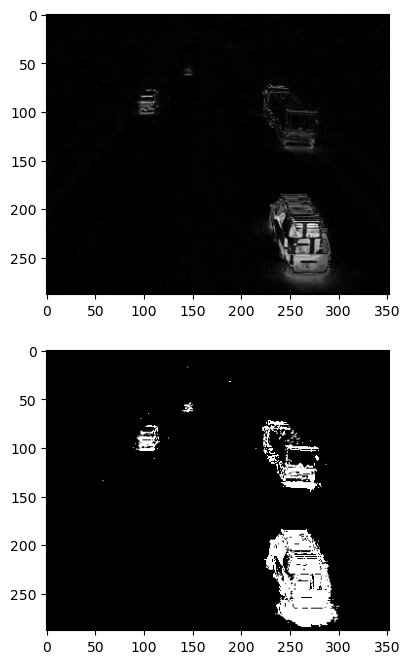

In [45]:
img_diff = ICV_frame_diff(frames[0], frames[1])
classified_img = ICV_classification(img_diff, threshold=15)
fig, axs = plt.subplots(2, figsize=(10, 8))
axs[0].imshow(img_diff, cmap='gray')
axs[1].imshow(classified_img, cmap='gray')

cv.imwrite('5b_frame1.jpg', frames[1])
plt.imsave('5b_diff1.jpg', img_diff, cmap='gray')
plt.imsave('5b_threshold1.jpg', classified_img, cmap='gray')
plt.imshow(classified_img, cmap='gray')
img_diff_h = ICV_hist_gray(img_diff)

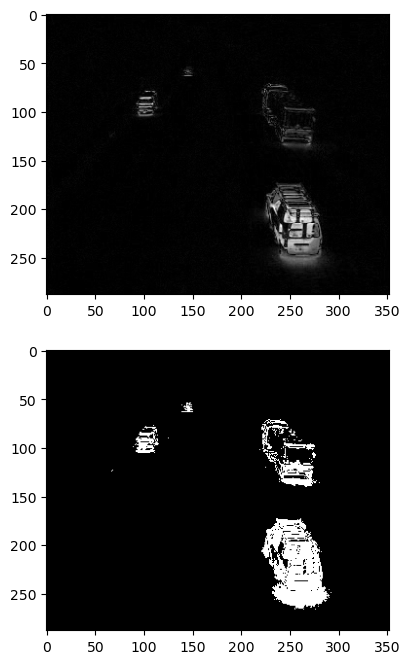

In [46]:
img_diff = ICV_frame_diff(frames[1], frames[2])
classified_img = ICV_classification(img_diff, threshold=15)
fig, axs = plt.subplots(2, figsize=(10, 8))
axs[0].imshow(img_diff, cmap='gray')
axs[1].imshow(classified_img, cmap='gray')

cv.imwrite('5b_frame2.jpg', frames[2])
plt.imsave('5b_diff2.jpg', img_diff, cmap='gray')
plt.imsave('5b_threshold2.jpg', classified_img, cmap='gray')
plt.imshow(classified_img, cmap='gray')
img_diff_h = ICV_hist_gray(img_diff)

### Question 5c

In [47]:
def ICV_gen_ref(frames):
    ref_img = frames[0].copy()
    ref_classified_img = ICV_classification(ICV_frame_diff(frames[0], frames[100]), threshold=10)
    ref_img[ref_classified_img > 0] = [0, 0, 0]

    interval = int(len(frames) / 2)
    for f in range(1, interval):
        classified_img = ICV_classification(ICV_frame_diff(frames[f], frames[f + interval]), threshold=15)
        tmp = frames[f].copy()
        for i in range(ref_img.shape[0]):
            for j in range(ref_img.shape[1]):
                if classified_img[i][j] < 1:
                    if ref_img[i][j].sum() == 0:
                        ref_img[i][j] = tmp[i][j]
                    else:
                        ref_img[i][j] = ((ref_img[i][j].astype(float) + tmp[i][j].astype(float)) / 2).round()
    return ref_img

In [ ]:
ref_img = ICV_gen_ref(frames)
ref_img_RGB = np.array([np.array([np.flip(x) for x in y]) for y in ref_img])
plt.imsave('5c.jpg', ref_img_RGB)
plt.imshow(ref_img_RGB)

### Question 5d

In [ ]:
def ICV_dilate(img, kernel):
    r_count, c_count = kernel.shape
    r_count = int(r_count / 2)
    c_count = int(c_count / 2)
    
    # padding
    padded_img = np.concatenate((np.zeros((1, img.shape[1])), img, np.zeros((1, img.shape[1]))))
    padded_img_T = padded_img.transpose()
    padded_img = np.concatenate((np.zeros((padded_img_T.shape[1], 1)), padded_img, np.zeros((padded_img_T.shape[1], 1))),axis=1)
    
    padded_img_shape = padded_img.shape
    ret_img = np.zeros((padded_img_shape[0], padded_img_shape[1]), dtype=int)
    for r in range(r_count, padded_img_shape[0] - r_count):
        for c in range(c_count, padded_img_shape[1] - c_count):
            # if the center pixel is 1, then superimpose the kernel
            if padded_img[r][c]:
                ret_img[r - r_count:r + r_count + 1, c - c_count:c + c_count + 1] = kernel.copy()
    return ret_img[1:-1, 1:-1]

def ICV_object_counting(img_dilate, kernel, threshold=1):
    img = img_dilate.copy()
    ones = np.array(np.where(img_dilate > 0)).transpose()
    r_count, c_count = kernel.shape
    r_count = int(r_count / 2)
    c_count = int(c_count / 2)
    center = (r_count, c_count)
    count = 0

    # padding
    padded_img = np.concatenate((np.zeros((1, img.shape[1])), img, np.zeros((1, img.shape[1]))))
    padded_img_T = padded_img.transpose()
    padded_img = np.concatenate((np.zeros((padded_img_T.shape[1], 1)), padded_img, np.zeros((padded_img_T.shape[1], 1))),axis=1)
    padded_img_ref = padded_img.copy()

    # while there is still white pixel in the image
    while len(ones) > 0:
        to_be_explored = [(ones[0][0], ones[0][1])]
        explored = []
        # while there are stil neighbouring white pixel to be explored
        while len(to_be_explored) > 0:
            explored.append(to_be_explored[0])
            del to_be_explored[0]
            r_offset = explored[-1][0] - r_count
            c_offset = explored[-1][1] - c_count
            # loop through the window
            for r in range(r_offset, explored[-1][0] + r_count + 1):
                for c in range(c_offset, explored[-1][1] + c_count + 1):
                    # if the pixel is white and matched kernel criteria
                    if padded_img_ref[r][c].sum() > 0 and padded_img_ref[r][c] == kernel[r - r_offset][c - c_offset]:
                        new_pixel = (r, c)
                        # set explored pixel to black
                        padded_img[r][c] = 0
                        # append new pixel coordinate if it is never been explored or in the list of to be explored
                        if new_pixel not in explored and new_pixel not in to_be_explored:
                            to_be_explored.append(new_pixel)
        # if all the neigbouring pixel id done visting, consider it as an object if the pixel for that object is larger than the threshold
        # threshold is set to avoid tiny noises that was not filtered
        if len(explored) > threshold:
            count += 1
        # recalculate for the coordinate of white pixel in the image
        ones = np.array(np.where(padded_img > 0)).transpose()
    return count

In [ ]:
x = [i for i in range(1, len(frames) + 1)]
y = []
for i in range(len(frames)):
    # image differencing
    img_diff = ICV_frame_diff(ref_img, frames[i])
    # filter out the noise
    kernel = np.zeros((3, 3), dtype=float)
    kernel += (1 / (kernel.shape[0] * kernel.shape[1]))
    img_conv = ICV_conv(img_diff, kernel)
    # generate classified image for foreground and background pixels
    classified_img = ICV_classification(img_conv, threshold=30)
    # dilate the classified image to fill in the "gap"
    kernel = np.ones((7, 7), dtype=int)
    img_dilate = ICV_dilate(classified_img, kernel)
    # count for the number of foreground objects
    kernel = np.ones((3, 3), dtype=int)
    y.append(ICV_object_counting(img_dilate, kernel, threshold=2))

In [ ]:
plt.bar(x, y)
plt.xlabel('Frame')
plt.ylabel('Number of Objects')
plt.savefig('5d.jpg')